First we start by cleaning / combining all the datasets we are working with.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


In [2]:

df_all = pd.read_csv("df_all.csv")
df_owner_info = pd.read_csv("df_owner_info.csv")

df_housing_complaints = pd.read_csv("df_housing_complaints.csv")
df_owners_hosuing_complaints= pd.read_csv("df_owners_hosuing_complaints.csv")

In [3]:
df_owner_info.head()

,Unnamed: 0,owner,num_low_violations,num_medium_violations,num_high_violations,num_units_owned
0,0,36-38 CUNARD STREET LLC,1.0,0.0,0.0,1
1,1,CRISTALLO GINA TS,2.0,3.0,0.0,1
2,2,GPD BRIMMER 4 LLC,2.0,0.0,0.0,1
3,3,GUIDO DOMINGOS DOS SANTOS,1.0,3.0,1.0,1
4,4,LOTUS AVENUE LLC,2.0,4.0,1.0,1


In [4]:
df_owner_info["num_total_violations"] = df_owner_info.apply(lambda x: (( x.num_low_violations  + x.num_medium_violations + x.num_high_violations) ) , axis = 1)
df_owner_info["score"] = df_owner_info.apply(lambda x: ((( x.num_low_violations * .2) + (x.num_medium_violations*.3) + (x.num_high_violations*.5)) / x.num_units_owned) , axis = 1)


In [5]:
df_owners_hosuing_complaints["num_total_violations"] = df_owners_hosuing_complaints.apply(lambda x: (( x.num_low_violations  + x.num_medium_violations + x.num_high_violations) ) , axis = 1)
df_owners_hosuing_complaints["score"] = df_owners_hosuing_complaints.apply(lambda x: ((( x.num_low_violations * .2) + (x.num_medium_violations*.3) + (x.num_high_violations*.5)) / x.num_units_owned) , axis = 1)


In [6]:
df_all.head()

,Unnamed: 0,violation_type,description,address,owner,latitude,longitude,violation_date,year_built,violation_severity
0,0,Enforcement Violations,Improper storage trash: res,"26-30 FLEET ST, 02113",PIZZUTI DONATO F,42.36459,-71.05254,2022-10-27T00:00:00,1920.0,low
1,1,Enforcement Violations,Improper storage trash: res,"354-356 HANOVER ST, 02113",ORANGE TREE LANE TRUST,42.36521,-71.05327,2022-10-27T00:00:00,1899.0,low
2,2,Enforcement Violations,Improper storage trash: res,"16-18 HANOVER AVE, 02109",16-18 HANOVER AVENUE REALTY TRUST,42.36581,-71.05218,2022-10-27T00:00:00,1899.0,low
3,3,Enforcement Violations,Improper storage trash: res,"194 SALEM ST # 5, 02113",16 MYSTIC STREET LLC,42.36690,-71.05457,2022-10-27T00:00:00,1910.0,low
4,4,Enforcement Violations,Improper storage trash: res,"213 HANOVER ST, 02113",CAPARELLA ROBERT A,42.36271,-71.05530,2022-10-27T00:00:00,1899.0,low


In [7]:
df_owner_info.head()

,Unnamed: 0,owner,num_low_violations,num_medium_violations,num_high_violations,num_units_owned,num_total_violations,score
0,0,36-38 CUNARD STREET LLC,1.0,0.0,0.0,1,1.0,0.2
1,1,CRISTALLO GINA TS,2.0,3.0,0.0,1,5.0,1.3
2,2,GPD BRIMMER 4 LLC,2.0,0.0,0.0,1,2.0,0.4
3,3,GUIDO DOMINGOS DOS SANTOS,1.0,3.0,1.0,1,5.0,1.6
4,4,LOTUS AVENUE LLC,2.0,4.0,1.0,1,7.0,2.1


Here is the number of violations for each types of violations.

Text(0, 0.5, 'Count')

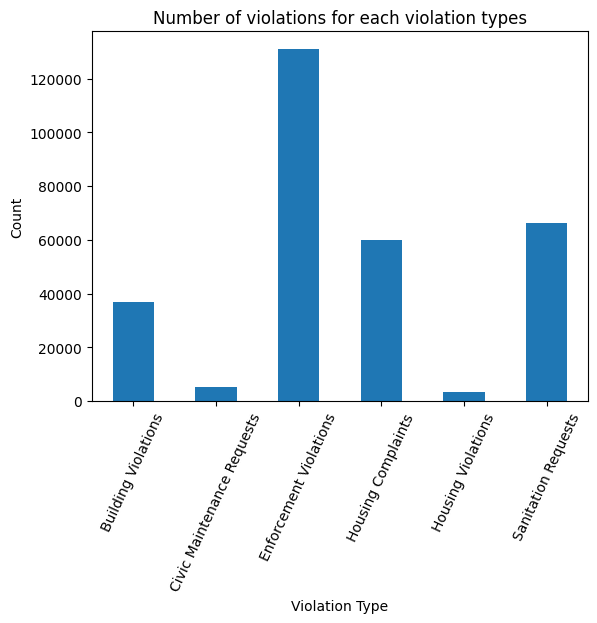

In [8]:
num_violations = df_all.groupby("violation_type")["violation_type"].count()
ax = num_violations.plot.bar(x='violation_type', y='count', rot=0)
ax.tick_params(axis="x", labelrotation= 65)
plt.title("Number of violations for each violation types")
plt.xlabel("Violation Type")
plt.ylabel("Count")

Text(0, 0.5, 'Count')

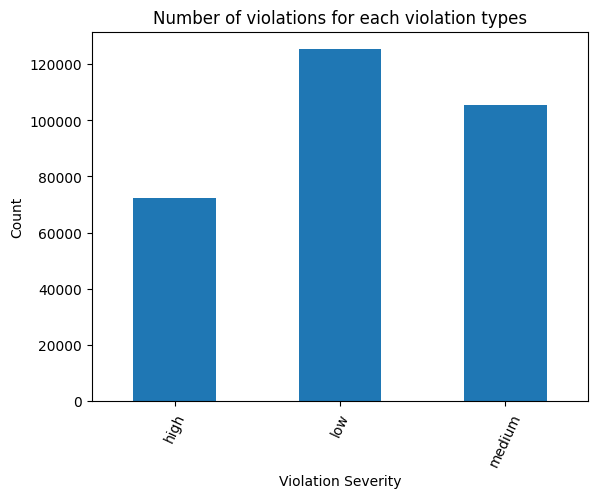

In [9]:
num_violations = df_all.groupby("violation_severity")["violation_severity"].count()
ax = num_violations.plot.bar(x='violation_severity', y='count', rot=0)
ax.tick_params(axis="x", labelrotation= 65)
plt.title("Number of violations for each violation types")
plt.xlabel("Violation Severity")
plt.ylabel("Count")

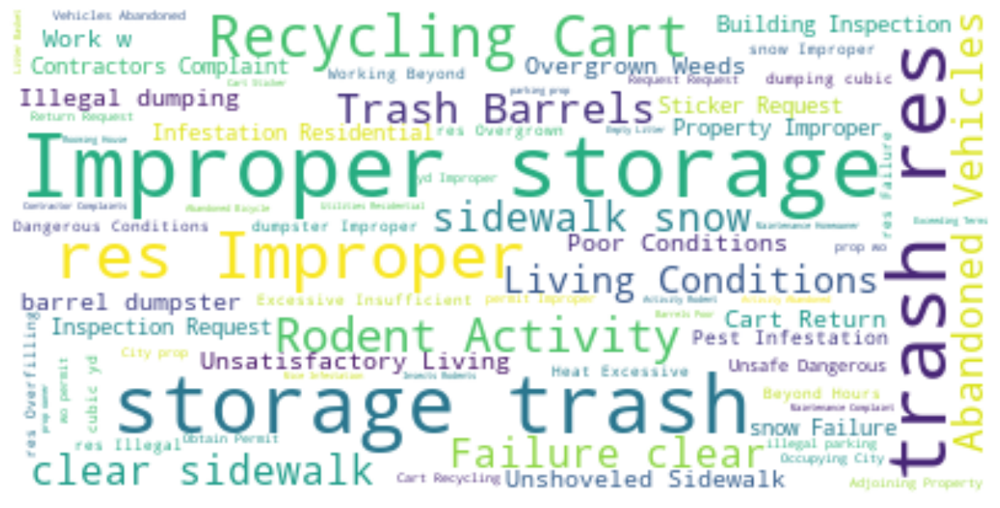

In [10]:
from wordcloud import WordCloud
text = " ".join(i for i in df_all.description)
wordcloud = WordCloud( background_color="white").generate(text)
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

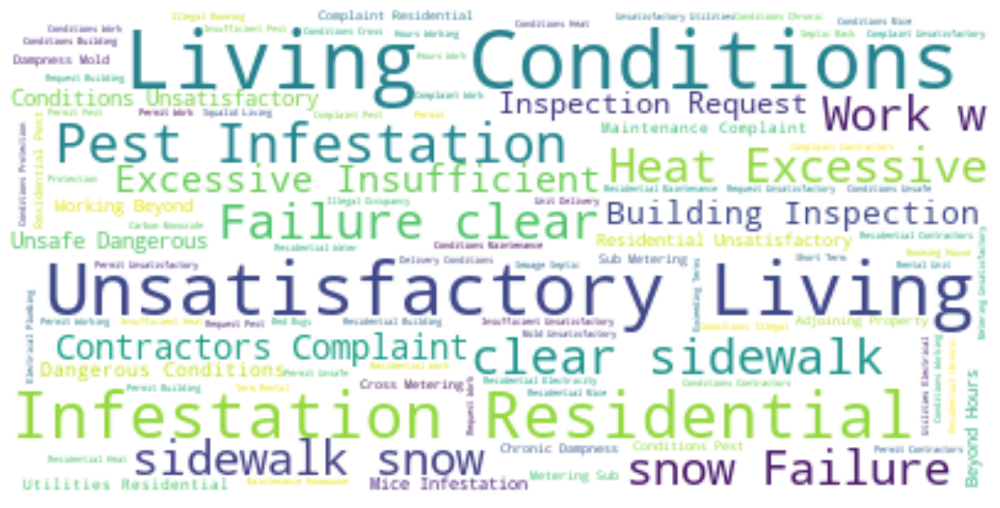

In [11]:
from wordcloud import WordCloud
text = " ".join(i for i in df_housing_complaints.description)
wordcloud = WordCloud( background_color="white").generate(text)
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

Text(0, 0.5, 'Score')

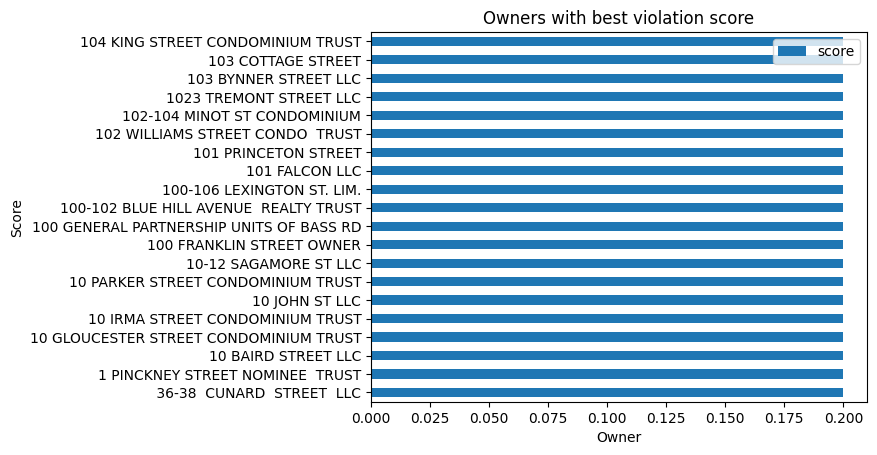

In [12]:
best_owners = df_owner_info.nsmallest(20, ['score'])
ax = best_owners.plot.barh(x='owner', y='score', rot=0)
ax.tick_params(axis="x")
plt.title("Owners with best violation score")
plt.xlabel("Owner")
plt.ylabel("Score")

Text(0, 0.5, 'Score')

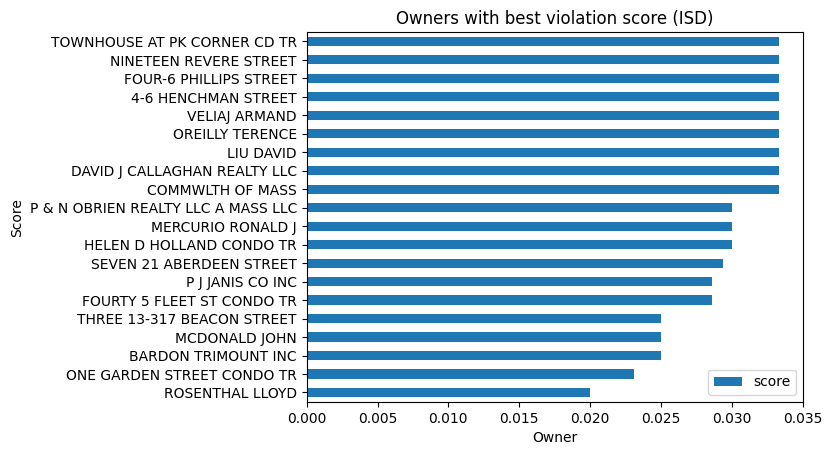

In [13]:
best_owners = df_owners_hosuing_complaints.nsmallest(20, ['score'])
ax = best_owners.plot.barh(x='owner', y='score', rot=0)
ax.tick_params(axis="x")
plt.title("Owners with best violation score (ISD)")
plt.xlabel("Owner")
plt.ylabel("Score")

Text(0, 0.5, 'Total number of Violations')

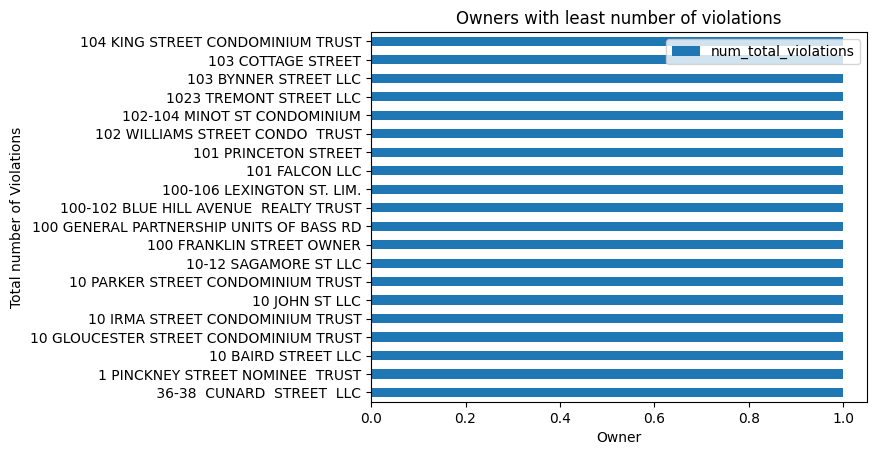

In [14]:
best_owners = df_owner_info.nsmallest(20, ['num_total_violations'])
ax = best_owners.plot.barh(x='owner', y='num_total_violations', rot=0)
ax.tick_params(axis="x")
plt.title("Owners with least number of violations")
plt.xlabel("Owner")
plt.ylabel("Total number of Violations")

Text(0, 0.5, 'Total number of Violations')

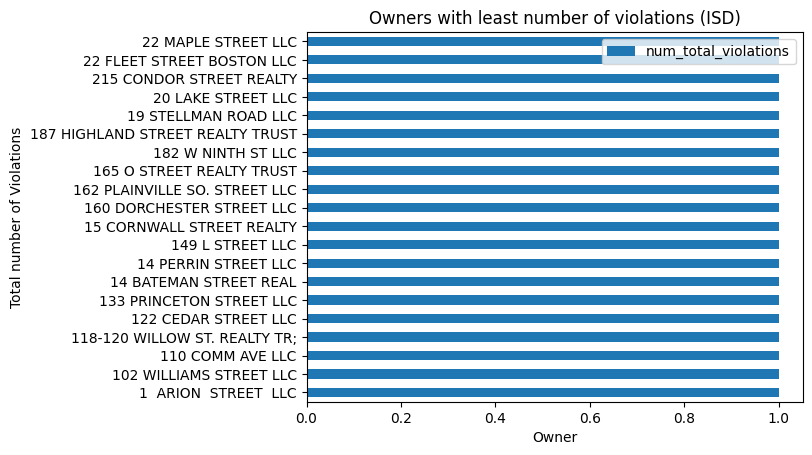

In [15]:
best_owners = df_owners_hosuing_complaints.nsmallest(20, ['num_total_violations'])
ax = best_owners.plot.barh(x='owner', y='num_total_violations', rot=0)
ax.tick_params(axis="x")
plt.title("Owners with least number of violations (ISD)")
plt.xlabel("Owner")
plt.ylabel("Total number of Violations")

Text(0, 0.5, 'Score')

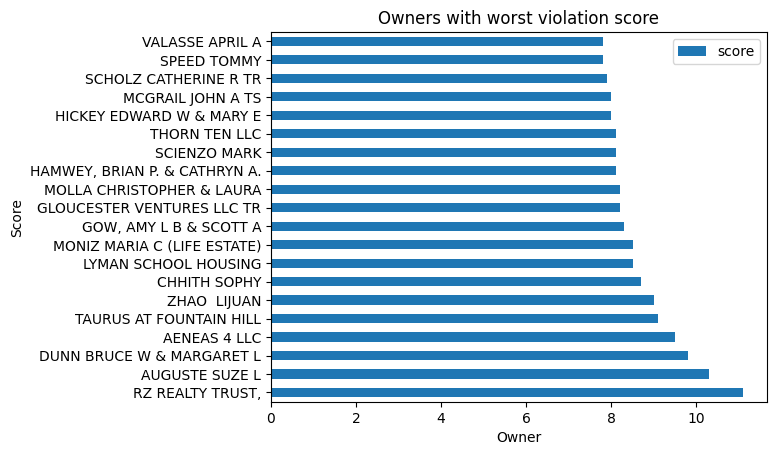

In [16]:
worst_owners = df_owner_info.nlargest(20, ['score'])
ax = worst_owners.plot.barh(x='owner', y='score', rot=0)
ax.tick_params(axis="x")
plt.title("Owners with worst violation score")
plt.xlabel("Owner")
plt.ylabel("Score")

Text(0, 0.5, 'Score')

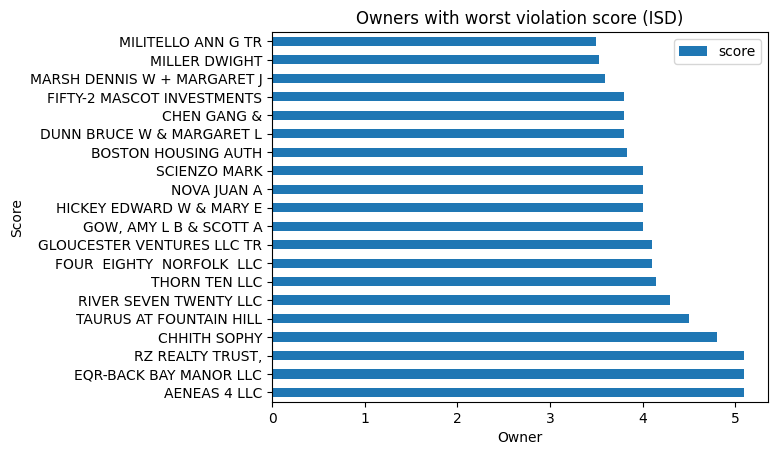

In [17]:
worst_owners = df_owners_hosuing_complaints.nlargest(20, ['score'])
ax = worst_owners.plot.barh(x='owner', y='score', rot=0)
ax.tick_params(axis="x")
plt.title("Owners with worst violation score (ISD)")
plt.xlabel("Owner")
plt.ylabel("Score")

Text(0, 0.5, 'Total number of Violations')

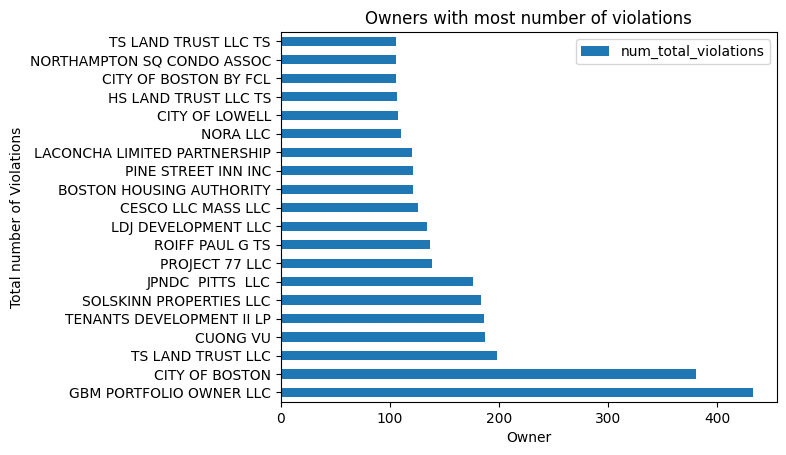

In [18]:
worst_owners = df_owner_info.nlargest(20, ['num_total_violations'])
ax = worst_owners.plot.barh(x='owner', y='num_total_violations', rot=0)
ax.tick_params(axis="x")
plt.title("Owners with most number of violations")
plt.xlabel("Owner")
plt.ylabel("Total number of Violations")

Text(0, 0.5, 'Total number of Violations')

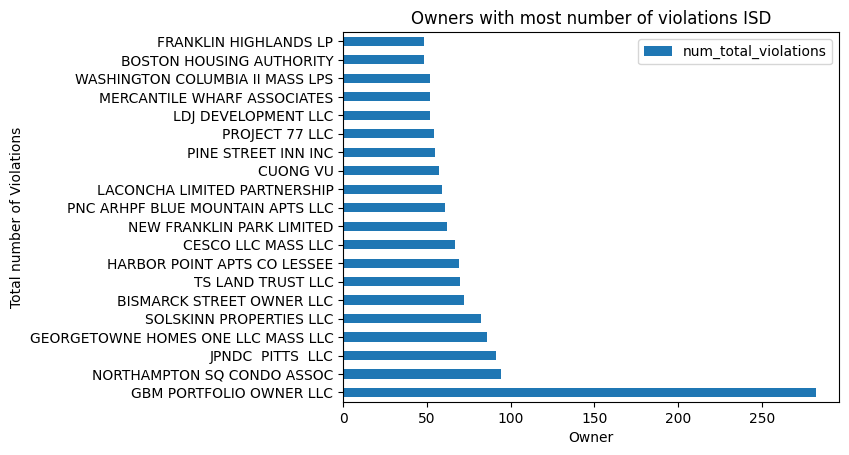

In [19]:
worst_owners = df_owners_hosuing_complaints.nlargest(20, ['num_total_violations'])
ax = worst_owners.plot.barh(x='owner', y='num_total_violations', rot=0)
ax.tick_params(axis="x")
plt.title("Owners with most number of violations ISD")
plt.xlabel("Owner")
plt.ylabel("Total number of Violations")

In [20]:
#import needed libs
import geopandas as gpd
from shapely.geometry import Point, Polygon
import shapefile as shp
import seaborn as sns

#get data
shap = gpd.read_file('Shapes/district.shp')

all_copy = df_all.copy()
geometry = [Point(xy) for xy in zip(all_copy['longitude'], all_copy['latitude'])]
crs = {'init': 'epsg:4326'}
geo_all= gpd.GeoDataFrame(all_copy, crs= crs,  geometry = geometry)

#isolating shapes by districts

shape_1 = shap.loc[shap['LONGNAME']=='District 1']
shape_2 = shap.loc[shap['LONGNAME']=='District 2']
shape_3 = shap.loc[shap['LONGNAME']=='District 3']
shape_4 = shap.loc[shap['LONGNAME']=='District 4']
shape_5 = shap.loc[shap['LONGNAME']=='District 5']
shape_6 = shap.loc[shap['LONGNAME']=='District 6']
shape_7 = shap.loc[shap['LONGNAME']=='District 7']
shape_8 = shap.loc[shap['LONGNAME']=='District 8']
shape_9 = shap.loc[shap['LONGNAME']=='District 9']
all_districts = gpd.GeoDataFrame(df_all, crs= crs, geometry = geometry)

#isolating district polygons
shape_1_poly = shape_1.iloc[0]['geometry']
shape_2_poly = shape_2.iloc[0]['geometry']
shape_3_poly = shape_3.iloc[0]['geometry']
shape_4_poly = shape_4.iloc[0]['geometry']
shape_5_poly = shape_5.iloc[0]['geometry']
shape_6_poly = shape_6.iloc[0]['geometry']
shape_7_poly = shape_7.iloc[0]['geometry']
shape_8_poly = shape_8.iloc[0]['geometry']
shape_9_poly = shape_9.iloc[0]['geometry']

#getting districts for addresses
geo_all['intersect district 1'] = geo_all.intersects(shape_1_poly)
geo_all['intersect district 2'] = geo_all.intersects(shape_2_poly)
geo_all['intersect district 3'] = geo_all.intersects(shape_3_poly)
geo_all['intersect district 4'] = geo_all.intersects(shape_4_poly)
geo_all['intersect district 5'] = geo_all.intersects(shape_5_poly)
geo_all['intersect district 6'] = geo_all.intersects(shape_6_poly)
geo_all['intersect district 7'] = geo_all.intersects(shape_7_poly)
geo_all['intersect district 8'] = geo_all.intersects(shape_8_poly)
geo_all['intersect district 9'] = geo_all.intersects(shape_9_poly)

geo_all


C:\Users\SUEDA\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\SUEDA\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


,Unnamed: 0,violation_type,description,address,owner,latitude,longitude,violation_date,year_built,violation_severity,geometry,intersect district 1,intersect district 2,intersect district 3,intersect district 4,intersect district 5,intersect district 6,intersect district 7,intersect district 8,intersect district 9
0,0,Enforcement Violations,Improper storage trash: res,"26-30 FLEET ST, 02113",PIZZUTI DONATO F,42.36459,-71.05254,2022-10-27T00:00:00,1920.0,low,POINT (-71.05254 42.36459),True,False,False,False,False,False,False,False,False
1,1,Enforcement Violations,Improper storage trash: res,"354-356 HANOVER ST, 02113",ORANGE TREE LANE TRUST,42.36521,-71.05327,2022-10-27T00:00:00,1899.0,low,POINT (-71.05327 42.36521),True,False,False,False,False,False,False,False,False
2,2,Enforcement Violations,Improper storage trash: res,"16-18 HANOVER AVE, 02109",16-18 HANOVER AVENUE REALTY TRUST,42.36581,-71.05218,2022-10-27T00:00:00,1899.0,low,POINT (-71.05218 42.36581),True,False,False,False,False,False,False,False,False
3,3,Enforcement Violations,Improper storage trash: res,"194 SALEM ST # 5, 02113",16 MYSTIC STREET LLC,42.36690,-71.05457,2022-10-27T00:00:00,1910.0,low,POINT (-71.05457 42.36690),True,False,False,False,False,False,False,False,False
4,4,Enforcement Violations,Improper storage trash: res,"213 HANOVER ST, 02113",CAPARELLA ROBERT A,42.36271,-71.05530,2022-10-27T00:00:00,1899.0,low,POINT (-71.05530 42.36271),True,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
302992,357427,Sanitation Requests,Request for Recycling Cart,707 E FIFTH ST,COVELL WALTER P,42.33390,-71.03180,2021-12-30 14:53:00,1900.0,medium,POINT (-71.03180 42.33390),False,True,False,False,False,False,False,False,False
302993,357428,Sanitation Requests,Request for Recycling Cart,75 EVERDEAN ST,MURPHY KATHLEEN,42.29850,-71.05100,2021-12-30 15:39:00,1960.0,medium,POINT (-71.05100 42.29850),False,False,True,False,False,False,False,False,False
302994,357429,Enforcement Violations,Improper Storage of Trash (Barrels),27 BEACH ST,FRANCIOSA JOSEPH V,42.35130,-71.06180,2021-12-30 18:03:15,1889.0,low,POINT (-71.06180 42.35130),False,True,False,False,False,False,False,False,False
302995,357432,Sanitation Requests,Sticker Request,64 PETER PARLEY RD,HORAN RICHARD A,42.31050,-71.09920,2021-12-31 14:41:00,1890.0,medium,POINT (-71.09920 42.31050),False,False,False,False,False,True,False,False,False


In [21]:

geo_all_owner = pd.merge(geo_all, df_owner_info, how='inner', on='owner')
geo_all_owner['norm_score'] = 0

geo_all_owner['norm_score1'] = geo_all_owner.loc[geo_all_owner['intersect district 1']==True, 'score']/208081
geo_all_owner['norm_score2'] = geo_all_owner.loc[geo_all_owner['intersect district 2']==True, 'score']/102759
geo_all_owner['norm_score3'] = geo_all_owner.loc[geo_all_owner['intersect district 3']==True, 'score']/160668
geo_all_owner['norm_score4'] = geo_all_owner.loc[geo_all_owner['intersect district 4']==True, 'score']/131856
geo_all_owner['norm_score5'] = geo_all_owner.loc[geo_all_owner['intersect district 5']==True, 'score']/102641
geo_all_owner['norm_score6'] = geo_all_owner.loc[geo_all_owner['intersect district 6']==True, 'score']/78611
geo_all_owner['norm_score7'] = geo_all_owner.loc[geo_all_owner['intersect district 7']==True, 'score']/125147
geo_all_owner['norm_score8'] = geo_all_owner.loc[geo_all_owner['intersect district 8']==True, 'score']/239160
geo_all_owner['norm_score9'] = geo_all_owner.loc[geo_all_owner['intersect district 9']==True, 'score']/136745

geo_all_owner.fillna(0, inplace=True)
geo_all_owner.isna().sum()

geo_all_owner['norm_score'] = geo_all_owner['norm_score1']+geo_all_owner['norm_score2']+geo_all_owner['norm_score3']+geo_all_owner['norm_score4']+geo_all_owner['norm_score5']+geo_all_owner['norm_score6']+geo_all_owner['norm_score7']+geo_all_owner['norm_score8']+geo_all_owner['norm_score9']
geo_all_owner.head()


,Unnamed: 0_x,violation_type,description,address,owner,latitude,longitude,violation_date,year_built,violation_severity,...,norm_score,norm_score1,norm_score2,norm_score3,norm_score4,norm_score5,norm_score6,norm_score7,norm_score8,norm_score9
0,0,Enforcement Violations,Improper storage trash: res,"26-30 FLEET ST, 02113",PIZZUTI DONATO F,42.364590,-71.052540,2022-10-27T00:00:00,1920.0,low,...,0.000003,0.000003,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
1,227,Enforcement Violations,Improper storage trash: res,"70-72 JOY ST, 02114",PIZZUTI DONATO F,42.360630,-71.065330,2022-10-26T00:00:00,1899.0,low,...,0.000003,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000003,0.0
2,978,Enforcement Violations,Improper storage trash: res,"254-256 FRIEND ST, 02114",PIZZUTI DONATO F,42.364488,-71.061337,2022-10-24T00:00:00,1899.0,low,...,0.000003,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000003,0.0
3,1007,Enforcement Violations,Improper storage trash: res,"212-228 HANOVER ST, 02113",PIZZUTI DONATO F,42.363060,-71.055413,2022-10-24T00:00:00,1920.0,low,...,0.000003,0.000003,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
4,1008,Enforcement Violations,Illegal dumping < 1 cubic yd,"212-228 HANOVER ST, 02113",PIZZUTI DONATO F,42.363060,-71.055413,2022-10-24T00:00:00,1920.0,medium,...,0.000003,0.000003,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


In [22]:
#import required libraries
import folium 
from folium.plugins import HeatMap
#create dataframe to plot the most number of violations
most_vio = df_all.copy()
most_vio = pd.DataFrame(most_vio.groupby(['latitude','longitude']).size())
most_vio.reset_index(inplace=True)
most_vio.columns = ['latitude','longitude', 'num_vio']
most_vio.head(10)
#plot as a heatmap
bos_map = folium.Map(location=[42.349185, -71.104605], zoom_start = 11.5)
HeatMap(most_vio, min_opacity=0.4, blur=18).add_to(folium.FeatureGroup(name='Heat map').add_to(bos_map))
folium.LayerControl().add_to(bos_map)
#outputting the map
bos_map.save("most_vio_nbrhds.html")
bos_map


In [24]:
import folium 
from folium.plugins import HeatMap
#making merged df plottable by dropping unecessary columns
df_scoreplot = pd.DataFrame(geo_all_owner[['latitude','longitude','norm_score']])
df_scoreplot = pd.DataFrame(df_scoreplot.groupby(by=['latitude','longitude']).mean())
df_scoreplot.reset_index(inplace=True)
df_scoreplot.columns = ['latitude','longitude', 'num_vio']
#plot as a heatmap
bos_map2 = folium.Map(location=[42.349185, -71.104605])
HeatMap(df_scoreplot, min_opacity=0.4, blur=18).add_to(folium.FeatureGroup(name='Heat map').add_to(bos_map2))
folium.LayerControl().add_to(bos_map2)
#outputting the map
bos_map2.save("LL_score.html")
bos_map2
